In [1]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google'

In [ ]:
!mkdir CINIC-10

In [ ]:
%%capture
!tar -xvzf "/content/drive/My Drive/CINIC-10.tar.gz" -C "/content/CINIC-10/"

In [ ]:
!pip install onnx
!pip install pytorch-msssim

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 48.0 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manyl

In [ ]:
import os
import torch.nn as nn
import torch.nn.functional as F
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import torch.onnx

from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
from torch.cuda.amp import GradScaler, autocast
from torch.optim.lr_scheduler import StepLR, CosineAnnealingLR, ReduceLROnPlateau
from pytorch_msssim import SSIM

In [ ]:
class CINIC10Dataset(Dataset):
    def __init__(self, directory, transform=None):
        self.directory = directory
        self.transform = transform
        self.images = [os.path.join(dp, f) for dp, dn, filenames in os.walk(directory) for f in filenames if os.path.splitext(f)[1].lower() in ['.png', '.jpg', '.jpeg']]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        img = Image.open(img_path).convert('RGB')

        if self.transform:
            img = self.transform(img)

        # Convert image to grayscale
        img_gray = transforms.Grayscale()(img)

        return img_gray, img

In [ ]:
# cinic_mean = [0.47889522, 0.47227842, 0.43047404]
# cinic_std = [0.24205776, 0.23828046, 0.25874835]

transform = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ToTensor(),
])

In [ ]:
train_dataset = CINIC10Dataset(directory='/content/CINIC-10/train', transform=transform)
val_dataset = CINIC10Dataset(directory='/content/CINIC-10/valid', transform=transform)
test_dataset = CINIC10Dataset(directory='/content/CINIC-10/test', transform=transform)

In [ ]:
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers = 4)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False, num_workers = 4)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers = 4)

In [ ]:
def show_images(data_loader):
    data_iter = iter(data_loader)
    images_gray, images_color = next(data_iter)

    fig, axs = plt.subplots(2, 10, figsize=(20, 4))
    for i in range(10):
        # Normalize grayscale images
        grayscale_img = images_gray[i].permute(1, 2, 0).numpy()
        grayscale_img = np.clip(grayscale_img, 0, 1)  # Ensure the data range is within [0, 1]

        # Normalize color images
        color_img = images_color[i].permute(1, 2, 0).numpy()
        color_img = np.clip(color_img, 0, 1)  # Ensure the data range is within [0, 1]

        # Show grayscale images
        axs[0, i].imshow(grayscale_img, cmap='gray')
        axs[0, i].axis('off')

        # Show color images
        axs[1, i].imshow(color_img)
        axs[1, i].axis('off')

    plt.show()

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


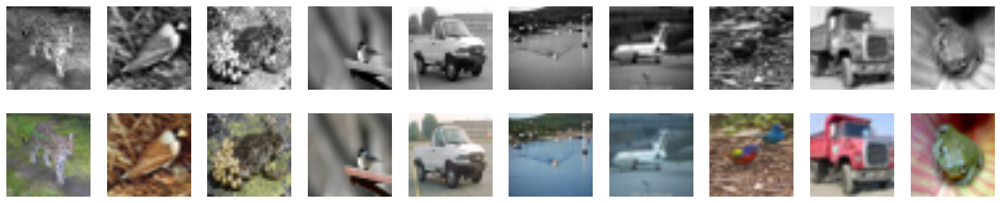

In [ ]:
show_images(train_loader)

In [ ]:
class AutoEncoder(nn.Module):
    def __init__(self):
        super(AutoEncoder, self).__init__()
        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm2d(32),
            nn.Dropout(0.25),
            nn.Conv2d(32, 64, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm2d(64),
            nn.Dropout(0.25),
            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm2d(128),
            nn.Conv2d(128, 256, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm2d(256)
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm2d(128),
            nn.Dropout(0.25),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm2d(64),
            nn.Dropout(0.25),
            nn.ConvTranspose2d(64, 32, 4, stride=2, padding=1),
            nn.LeakyReLU(),
            nn.BatchNorm2d(32),
            nn.ConvTranspose2d(32, 3, 4, stride=2, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [ ]:
model = AutoEncoder().to(device)

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)
epochs = 50

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


In [ ]:
def train(model, train_dataloader, val_dataloader):
    train_losses = []
    val_losses = []

    for epoch in range(epochs):

        model.train()
        running_loss = 0.0
        for data in train_dataloader:
            grayscale, color = [x.to(device) for x in data]
            optimizer.zero_grad()
            output = model(grayscale)
            loss = criterion(output, color)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        train_loss = running_loss / len(train_dataloader)
        train_losses.append(train_loss)

        model.eval()
        running_val_loss = 0.0

        with torch.no_grad():

          for data in val_dataloader:
                grayscale, color = [x.to(device) for x in data]
                output = model(grayscale)
                val_loss = criterion(output, color)
                running_val_loss += val_loss.item()
        val_loss = running_val_loss / len(val_dataloader)
        val_losses.append(val_loss)

        scheduler.step(val_loss)

        print(f'Epoch {epoch + 1}, Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}')

    return train_losses, val_losses

In [ ]:
def test(model, dataloader):
    model.eval()
    test_losses = []
    with torch.no_grad():
        running_loss = 0.0
        for data in dataloader:
            grayscale, color = [x.to(device) for x in data]
            output = model(grayscale)
            loss = criterion(output, color)
            running_loss += loss.item()
        average_loss = running_loss / len(dataloader)
        test_losses.append(average_loss)
        print(f'Test Loss: {average_loss}')
    return test_losses

In [ ]:
train_losses, val_losses = train(model, train_loader, val_loader)

Epoch 1, Training Loss: 0.0094, Validation Loss: 0.0060
Epoch 2, Training Loss: 0.0064, Validation Loss: 0.0056
Epoch 3, Training Loss: 0.0060, Validation Loss: 0.0054
Epoch 4, Training Loss: 0.0059, Validation Loss: 0.0052
Epoch 5, Training Loss: 0.0058, Validation Loss: 0.0052
Epoch 6, Training Loss: 0.0057, Validation Loss: 0.0053
Epoch 7, Training Loss: 0.0056, Validation Loss: 0.0051
Epoch 8, Training Loss: 0.0056, Validation Loss: 0.0051
Epoch 9, Training Loss: 0.0056, Validation Loss: 0.0051
Epoch 10, Training Loss: 0.0055, Validation Loss: 0.0050
Epoch 11, Training Loss: 0.0055, Validation Loss: 0.0050
Epoch 12, Training Loss: 0.0055, Validation Loss: 0.0050
Epoch 13, Training Loss: 0.0054, Validation Loss: 0.0050
Epoch 14, Training Loss: 0.0054, Validation Loss: 0.0050
Epoch 15, Training Loss: 0.0054, Validation Loss: 0.0050
Epoch 16, Training Loss: 0.0054, Validation Loss: 0.0049
Epoch 17, Training Loss: 0.0054, Validation Loss: 0.0049
Epoch 18, Training Loss: 0.0053, Validat

In [ ]:
test_loss = test(model, test_loader)

Test Loss: 0.0047926852350833465


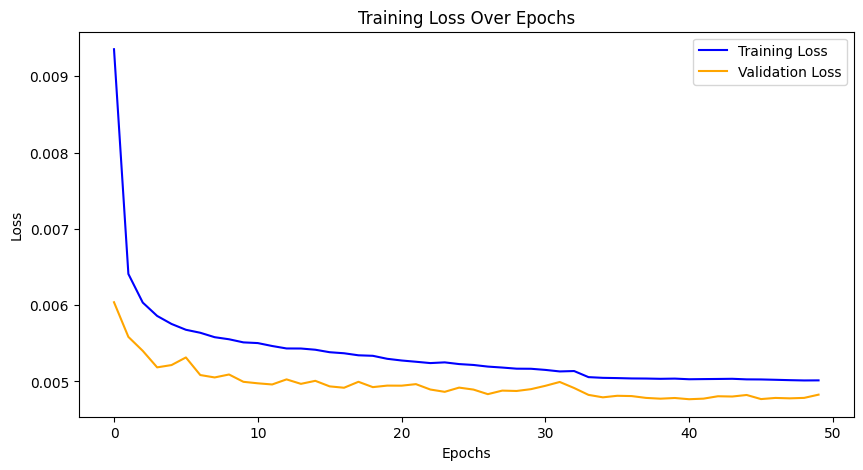

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss', color='blue')
plt.plot(val_losses, label='Validation Loss', color='orange')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.legend()
plt.show()

In [ ]:
def visualize_colorization(model, dataloader, device):
    model.eval()  # Set the model to evaluation mode
    model.to(device)

    with torch.no_grad():  # Turn off gradients for validation, saves memory and computations
        for data in dataloader:
            grayscale, color = data
            grayscale, color = grayscale.to(device), color.to(device)
            output = model(grayscale)  # Get model predictions

            # Move images back to CPU for visualization
            grayscale, color, output = grayscale.to('cpu'), color.to('cpu'), output.to('cpu')

            # Plotting
            batch_size = grayscale.size(0)
            fig, axs = plt.subplots(batch_size, 3, figsize=(9, 3 * batch_size))  # Adjust the size appropriately

            for i in range(batch_size):
                # Show grayscale image
                ax = axs[i, 0] if batch_size > 1 else axs[0]
                ax.imshow(grayscale[i].squeeze(), cmap='gray')
                ax.axis('off')
                ax.set_title('Grayscale')

                # Show ground truth color image
                ax = axs[i, 1] if batch_size > 1 else axs[1]
                ax.imshow(color[i].permute(1, 2, 0))
                ax.axis('off')
                ax.set_title('Ground Truth')

                # Show predicted color image
                ax = axs[i, 2] if batch_size > 1 else axs[2]
                ax.imshow(output[i].clamp(0, 1).permute(1, 2, 0))  # Clamp the output to [0, 1] to correct any out-of-bounds pixel values
                ax.axis('off')
                ax.set_title('Predicted Color')

            plt.show()
            break

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


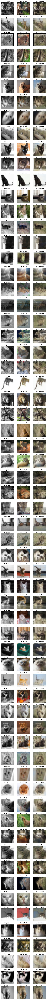

In [ ]:
visualize_colorization(model, test_loader, device)

In [ ]:
torch.save(model.state_dict(), f'auto_encoder_model_{epochs}_epochs_mse.pth')

In [ ]:
data_iter = iter(train_loader)
grayscale, color = next(data_iter)

model.eval()
grayscale = grayscale.to(device)

torch.onnx.export(model, grayscale, "model.onnx", opset_version=11, input_names=['input'], output_names=['output'])

In [ ]:
def visualize_filters(layer, num_filters=6):
    with torch.no_grad():
        # Ensure the layer is a convolutional layer
        if isinstance(layer, (nn.Conv2d, nn.ConvTranspose2d)):
            # Get the weight data of the layer
            weight = layer.weight.data.cpu().numpy()

            # Normalize and visualize the filters
            fig, axs = plt.subplots(1, num_filters, figsize=(20, 5))
            for idx in range(num_filters):
                # Select the filter index
                filter = weight[idx, 0]
                filter_min, filter_max = filter.min(), filter.max()
                filter = (filter - filter_min) / (filter_max - filter_min)
                axs[idx].imshow(filter, cmap='gray')
                axs[idx].axis('off')
            plt.show()
        else:
            print("Layer is not a convolutional layer.")

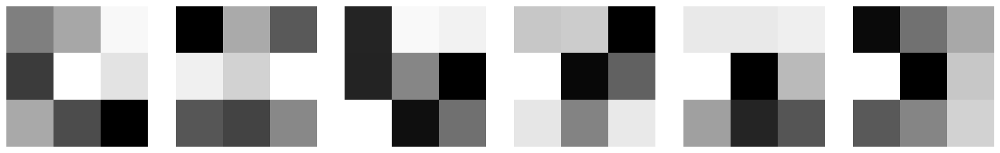

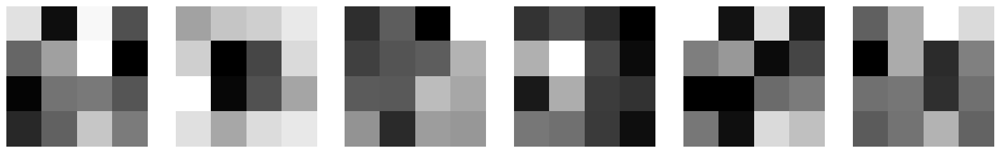

In [ ]:
encoder_first_conv = model.encoder[0]  # Access the first Conv2d module in the encoder
decoder_first_conv = model.decoder[0]  # Access the first ConvTranspose2d module in the decoder

# Visualize the filters
visualize_filters(encoder_first_conv)
visualize_filters(decoder_first_conv)